# 04 - ML models

Implementation and evaluation of ML models:Multiple Linear Regression, Ridge Regression, Elastic Net Regression and Random Forest 

## 4.1 Import libraries

In [1]:
# Import basic modules
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

import seaborn as sns
from matplotlib import rcParams

# Import regression and error metrics modules
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Import plotly modules to view time series in a more interactive way
import plotly.graph_objects as go
import pandas as pd

# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler

# Importing time series split for cross validation 
from sklearn.model_selection import TimeSeriesSplit

plt.style.use('bmh')

# special IPython command to prepare the notebook for matplotlib and other libraries
%matplotlib inline 

# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

## 4.2 Configuration

In [2]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

## 4.3 Load data set

In [3]:
df = pd.read_csv('Data_Model.csv', index_col = 'Date', infer_datetime_format=True)
df.head()

,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg
Date,,,,,,,,,,,,,,,
2011-08-01 00:00:00,2011,8,1,0,4.0,WSW,6.2,WSW,0.0,0.0,0.0,0.0,25.00,22.016667,0.0
2011-08-01 01:00:00,2011,8,1,1,4.5,WSW,14.0,WSW,0.0,0.0,0.0,0.0,24.80,22.083333,0.0
2011-08-01 02:00:00,2011,8,1,2,4.0,WSW,6.6,W,0.0,0.0,0.0,0.0,24.95,22.308333,0.0
2011-08-01 03:00:00,2011,8,1,3,4.5,WSW,6.4,WSW,0.0,0.0,0.0,0.0,24.80,22.100000,0.0
2011-08-01 04:00:00,2011,8,1,4,4.9,WSW,7.9,WSW,0.0,0.0,0.0,0.0,24.50,21.908333,0.0


In [4]:
df.tail(2)

,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg
Date,,,,,,,,,,,,,,,
2013-12-31 22:00:00,2013,12,31,22,2.7,NE,4.7,ENE,0.0,0.0,0.0,0.0,25.3,22.466667,0.0
2013-12-31 23:00:00,2013,12,31,23,3.5,NE,5.3,NNE,0.0,0.0,0.0,0.0,24.9,22.300000,0.0


In [5]:
df.index

Index(['2011-08-01 00:00:00', '2011-08-01 01:00:00', '2011-08-01 02:00:00',
       '2011-08-01 03:00:00', '2011-08-01 04:00:00', '2011-08-01 05:00:00',
       '2011-08-01 06:00:00', '2011-08-01 07:00:00', '2011-08-01 08:00:00',
       '2011-08-01 09:00:00',
       ...
       '2013-12-31 14:00:00', '2013-12-31 15:00:00', '2013-12-31 16:00:00',
       '2013-12-31 17:00:00', '2013-12-31 18:00:00', '2013-12-31 19:00:00',
       '2013-12-31 20:00:00', '2013-12-31 21:00:00', '2013-12-31 22:00:00',
       '2013-12-31 23:00:00'],
      dtype='object', name='Date', length=21218)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21218 entries, 2011-08-01 00:00:00 to 2013-12-31 23:00:00
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Year                    21218 non-null  int64  
 1   Month                   21218 non-null  int64  
 2   Day                     21218 non-null  int64  
 3   Hour                    21218 non-null  int64  
 4   MeanWS                  21218 non-null  float64
 5   MeanWD                  21218 non-null  object 
 6   MaxGustWS               21218 non-null  float64
 7   MaxGustWD               21218 non-null  object 
 8   Precipitation           21218 non-null  float64
 9   GlobalSolarRadiation    21218 non-null  float64
 10  TiltSolarIrradiance     21218 non-null  float64
 11  DiffuseSolarIrradiance  21218 non-null  float64
 12  OpenAirTempAvg          21218 non-null  float64
 13  ModuleTempAvg           21218 non-null  float64
 14  PowerAvg   

## 4.4 Defining basic functions

In [7]:
# Creating an empty dict to save all the erros from different models
dict_error = dict()

In [8]:
# creating function for plotting predicted vs actual energy values
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed power against the predicted power
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed power in kW")
    _ = plt.ylabel("Predicted power in kW")
    _ = plt.title("Predicted power vs Observed power for {} model".format(model_name))
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

In [9]:
def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics RMSE (root mean square error), R2 score, 
    MAE (mean absolute error)
    
    y_pred: predicted values of y 
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
     """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

In [10]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [11]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values 
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = "Predicted:{}".format(model_name),
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = "Predicted:{}".format(model_name),
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed and Predicted power using {} model'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [12]:
def train_test(data, test_size = 0.15, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'PowerAvg' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('PowerAvg', axis = 1).iloc[:test_index]
    y_train = df.PowerAvg.iloc[:test_index]
    X_test = df.drop('PowerAvg', axis = 1).iloc[test_index:]
    y_test = df.PowerAvg.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

## 4.5 Linear Regression Models

### 4.5.1 Multiple Linear Regression

In [13]:
df_mlr = df.copy()
df_mlr.columns

Index(['Year', 'Month', 'Day', 'Hour', 'MeanWS', 'MeanWD', 'MaxGustWS',
       'MaxGustWD', 'Precipitation', 'GlobalSolarRadiation',
       'TiltSolarIrradiance', 'DiffuseSolarIrradiance', 'OpenAirTempAvg',
       'ModuleTempAvg', 'PowerAvg'],
      dtype='object')

In [14]:
# creating categorical columns for linear regression 
cat_cols = ['Year', 'Month', 'Day', 'Hour','MeanWD','MaxGustWD']

for col in cat_cols:
    df_mlr[col] = df_mlr[col].astype('category')

In [15]:
# Preparing dummy columns for use in sklearn's linear regression 
df_mlr= pd.get_dummies(df_mlr, drop_first = True)

In [16]:
df_mlr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21218 entries, 2011-08-01 00:00:00 to 2013-12-31 23:00:00
Columns: 106 entries, MeanWS to MaxGustWD_WSW
dtypes: float64(9), uint8(97)
memory usage: 3.6+ MB


In [17]:
df_mlr.head(3)

,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg,Year_2012,Year_2013,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Day_2,Day_3,Day_4,Day_5,Day_6,Day_7,Day_8,Day_9,Day_10,Day_11,Day_12,Day_13,Day_14,Day_15,Day_16,Day_17,Day_18,Day_19,Day_20,Day_21,Day_22,Day_23,Day_24,Day_25,Day_26,Day_27,Day_28,Day_29,Day_30,Day_31,Hour_1,Hour_2,Hour_3,Hour_4,Hour_5,Hour_6,Hour_7,Hour_8,Hour_9,Hour_10,Hour_11,Hour_12,Hour_13,Hour_14,Hour_15,Hour_16,Hour_17,Hour_18,Hour_19,Hour_20,Hour_21,Hour_22,Hour_23,MeanWD_E,MeanWD_ENE,MeanWD_ESE,MeanWD_N,MeanWD_NE,MeanWD_NNE,MeanWD_NNW,MeanWD_NW,MeanWD_S,MeanWD_SE,MeanWD_SSE,MeanWD_SSW,MeanWD_SW,MeanWD_W,MeanWD_WNW,MeanWD_WSW,MaxGustWD_ENE,MaxGustWD_ESE,MaxGustWD_N,MaxGustWD_NE,MaxGustWD_NNE,MaxGustWD_NNW,MaxGustWD_NW,MaxGustWD_S,MaxGustWD_SE,MaxGustWD_SSE,MaxGustWD_SSW,MaxGustWD_SW,MaxGustWD_W,MaxGustWD_WNW,MaxGustWD_WSW
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-08-01 00:00:00,4.0,6.2,0.0,0.0,0.0,0.0,25.00,22.016667,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2011-08-01 01:00:00,4.5,14.0,0.0,0.0,0.0,0.0,24.80,22.083333,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2011-08-01 02:00:00,4.0,6.6,0.0,0.0,0.0,0.0,24.95,22.308333,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


#### Training and Testing data

In [18]:
len(df_mlr)

21218

In [19]:
df_mlr['Year_2013'].sum()

8761

In [20]:
df_mlr['Year_2012'].sum()

8785

In [21]:
#cols_to_transform = ['GlobalSolarRadiation','DiffuseSolarIrradiance', 'OpenAirTempAvg','ModuleTempAvg'] # other columns are binary values

cols_to_transform = ['MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']
X_train, X_test, y_train, y_test = train_test(df_mlr, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform)

# This creates a LinearRegression object
lm = LinearRegression()
lm

LinearRegression()

In [22]:
print('X_train shape: {}'. format (X_train.shape))
print('y_train shape: {}'. format (y_train.shape))
print('X_test shape: {}'. format (X_test.shape))
print('y_test shape: {}'. format (y_test.shape))
print('X_train index: {}'. format (X_train.index))
print('X_test index: {}'. format (X_test.index))

X_train shape: (18035, 105)
y_train shape: (18035,)
X_test shape: (3183, 105)
y_test shape: (3183,)
X_train index: Index(['2011-08-01 00:00:00', '2011-08-01 01:00:00', '2011-08-01 02:00:00',
       '2011-08-01 03:00:00', '2011-08-01 04:00:00', '2011-08-01 05:00:00',
       '2011-08-01 06:00:00', '2011-08-01 07:00:00', '2011-08-01 08:00:00',
       '2011-08-01 09:00:00',
       ...
       '2013-08-21 00:00:00', '2013-08-21 01:00:00', '2013-08-21 02:00:00',
       '2013-08-21 03:00:00', '2013-08-21 04:00:00', '2013-08-21 05:00:00',
       '2013-08-21 06:00:00', '2013-08-21 07:00:00', '2013-08-21 08:00:00',
       '2013-08-21 09:00:00'],
      dtype='object', name='Date', length=18035)
X_test index: Index(['2013-08-21 10:00:00', '2013-08-21 11:00:00', '2013-08-21 12:00:00',
       '2013-08-21 13:00:00', '2013-08-21 14:00:00', '2013-08-21 15:00:00',
       '2013-08-21 16:00:00', '2013-08-21 17:00:00', '2013-08-21 18:00:00',
       '2013-08-21 19:00:00',
       ...
       '2013-12-31 14:00:

In [23]:
# Fitting the linear regression model
lm.fit(X_train, y_train)

LinearRegression()

In [24]:
lm.coef_

array([ 1.08247399e+00,  6.42489931e-01, -2.98579278e-01, -3.24005249e+01,
        1.38311290e+02,  1.96311552e+01,  2.31337846e+00,  9.60574305e+00,
       -2.52373336e+00, -1.15500427e+01, -2.33703155e+00, -6.59763710e+00,
       -8.39063630e+00, -4.77688446e+00, -5.49056168e+00, -9.11704945e+00,
       -5.68891759e+00, -1.01232165e+01, -5.87333107e+00, -1.44261437e+01,
       -1.28423700e+01, -3.70185165e+00, -5.05309515e+00, -5.08580877e+00,
       -1.77001244e+00, -2.56069959e+00, -4.33617784e+00, -4.72340044e+00,
       -4.38132138e+00, -1.05358164e+00, -4.04682576e+00, -3.71422192e+00,
       -4.06237865e+00, -3.80840529e+00, -1.98426411e+00, -3.85255028e+00,
       -3.68475428e+00, -5.58852706e+00, -5.52077372e+00, -8.42407904e+00,
       -2.73793386e+00, -5.71208316e+00, -3.11209855e+00, -4.46155628e+00,
       -3.33263146e+00, -3.52425225e+00,  1.97589439e+00, -3.56364845e+00,
       -3.38339006e+00, -4.06102567e+00, -7.16522623e+00,  2.51313589e-01,
        5.75824508e-01,  

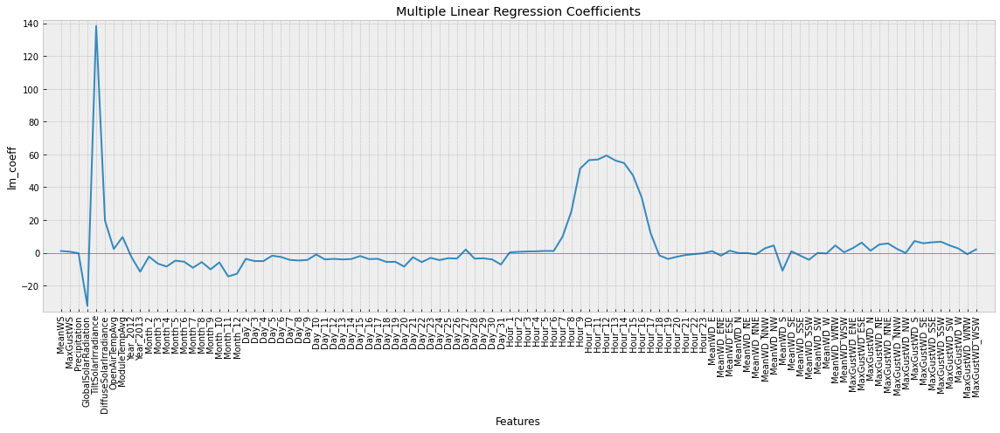

In [25]:
# Plotting the coefficients to check the importance of each coefficient 

# Plot the coefficients
_ = plt.figure(figsize = (16, 7))
_ = plt.plot(range(len(X_train.columns)), lm.coef_)
_ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation = 90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth = 0.5, color = 'r')
_ = plt.title('Multiple Linear Regression Coefficients')
_ = plt.ylabel('lm_coeff')
_ = plt.xlabel('Features')
_ = plt.tight_layout()

***
* The TiltSolarIrradiance is the most significant coeffecient. Power values increase with TiltSolarIrradiance. 
* The power increases significantly over the 6 hr to 18 hr.

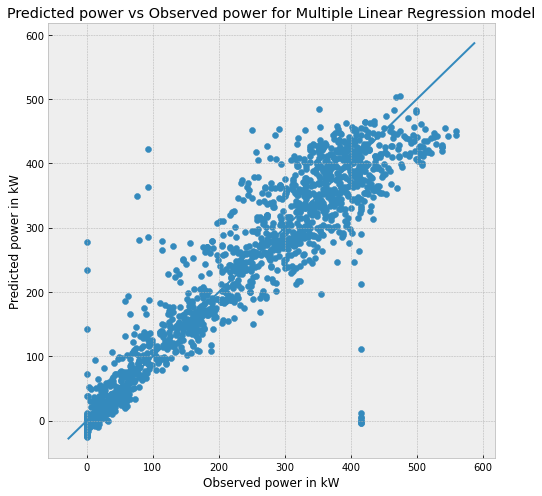

In [26]:
# Plotting lm.predict(X) vs observed Power

plot_predvstrue_reg(lm.predict(X_test), y_test, model_name = 'Multiple Linear Regression')

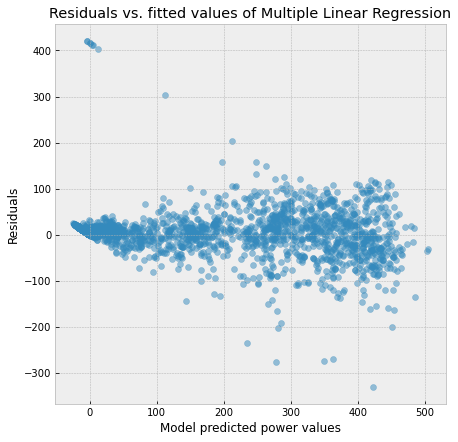

In [27]:
# PLotting the residuals
residuals = (y_test - lm.predict(X_test))
_ = plt.figure(figsize=(7,7))
_ = plt.scatter(lm.predict(X_test) , residuals, alpha = 0.5) 
_ = plt.xlabel("Model predicted power values")
_ = plt.ylabel("Residuals")
_ = plt.title("Residuals vs. fitted values of Multiple Linear Regression")

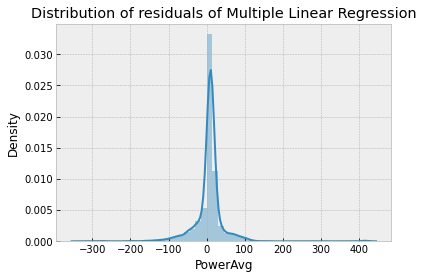

In [28]:
_ = sns.distplot((residuals),bins=50)
_ = plt.title('Distribution of residuals of Multiple Linear Regression')

In [29]:
error_metrics(lm.predict(X_train), y_train, model_name = 'Multiple Linear Regression with scaling', test = False)


Error metrics for model Multiple Linear Regression with scaling
RMSE or Root mean squared error: 38.88
Variance score: 0.94
Mean Absolute Error: 20.28


In [30]:
# on test set
error_metrics(lm.predict(X_test), y_test, model_name = 'Multiple Linear Regression with scaling', test = True)


Error metrics for model Multiple Linear Regression with scaling
RMSE or Root mean squared error: 40.62
Variance score: 0.93
Mean Absolute Error: 23.20


In [31]:
# Plotting the predicted values with the original time series (test set)
plot_ts_pred(y_test, lm.predict(X_test), model_name='Multiple Linear Regression', 
             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

Predicted and observed power output on daily basis. It can be observed that the model predicted the daily trend and seasonality well, but the high peaks were not predicted accurately. 

### 4.5.2 Ridge Regression

#### Fitting Ridge regression using sklearn (L2 regularization)

* Trying linear regression with regularization using the L2 norm (Ridge regression)

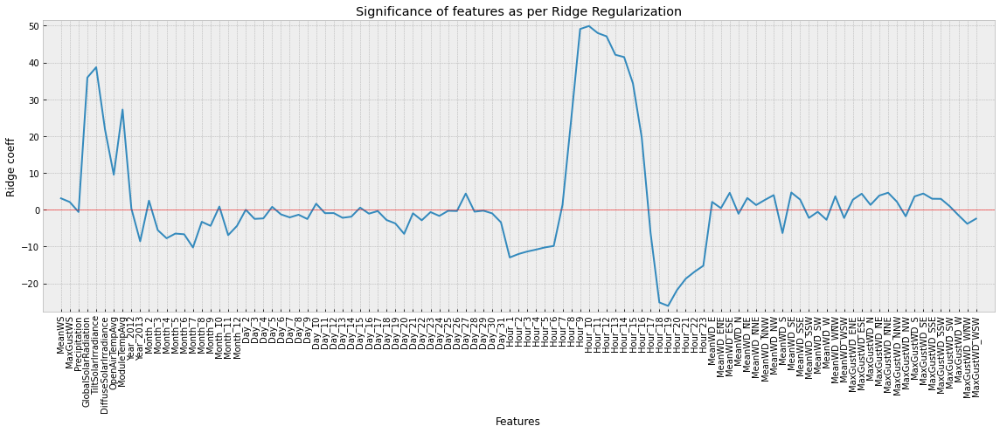

In [32]:
# Trying regularization: Ridge regression
from sklearn.linear_model import Ridge

# Instantiate a ridge regressor: ridge
ridge = Ridge(alpha = 0.1, normalize = True) #selecting alpha=0.1 here. 
# Tried different values from 0.01 to 0.4, results don't change much

# Fit the regressor to the data
ridge.fit(X_train, y_train)

# Compute and print the coefficients
ridge_coef = ridge.coef_
#print(ridge_coef)

# Plot the coefficients
_ = plt.figure(figsize = (16, 7))
_ = plt.plot(range(len(X_train.columns)), ridge_coef)
_ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation = 90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth = 0.5, color = 'r')
_ = plt.title('Significance of features as per Ridge Regularization')
_ = plt.ylabel('Ridge coeff')
_ = plt.xlabel('Features')
_ = plt.tight_layout()

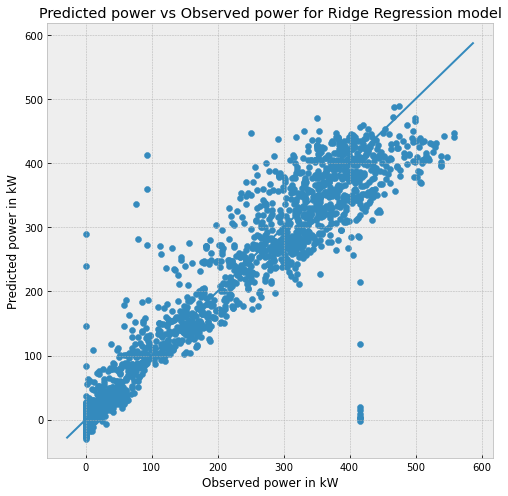

In [33]:
# Plotting ridge.predict(X) vs observed energy consumption

plot_predvstrue_reg(ridge.predict(X_test), y_test, model_name = 'Ridge Regression')

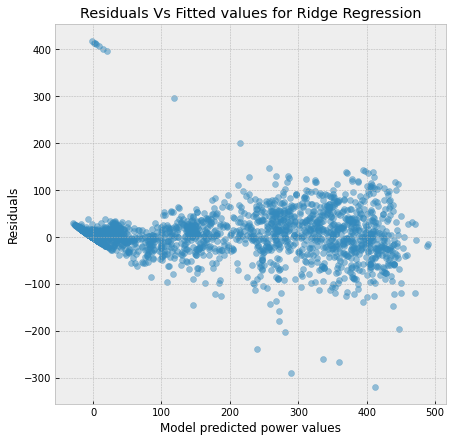

In [34]:
# PLotting the residuals
residuals = (y_test - ridge.predict(X_test))
_ = plt.figure(figsize=(7,7))
_ = plt.scatter(ridge.predict(X_test) , residuals, alpha = 0.5) 
_ = plt.xlabel("Model predicted power values")
_ = plt.ylabel("Residuals")
_ = plt.title("Residuals Vs Fitted values for Ridge Regression")

In [35]:
print('Ridge regression on training set')
error_metrics(ridge.predict(X_train), y_train, model_name = 'Ridge Regression with scaling', test = False)

print('\nRidge regression on test set')
error_metrics(ridge.predict(X_test), y_test, model_name = 'Ridge Regression with scaling', test = True)


Ridge regression on training set

Error metrics for model Ridge Regression with scaling
RMSE or Root mean squared error: 39.90
Variance score: 0.94
Mean Absolute Error: 22.23

Ridge regression on test set

Error metrics for model Ridge Regression with scaling
RMSE or Root mean squared error: 40.50
Variance score: 0.93
Mean Absolute Error: 22.16


In [36]:
# Plotting the predicted values with the original time series (test set)
plot_ts_pred(y_test, ridge.predict(X_test), model_name='Ridge Regression with scaling', 
             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

* Thus, we can see that the ridge regression and simple regression without any regularization perform decently well on the test set and the models don't overfit capturing the overall trend and seasonality pretty well. 
* The residuals as expected are not normally distributed and are biased towards the ends because the model doesn't predict the extreme values very well, especially the high power generation. 

####  Reducing the feature space <a name="3.4"></a>

* In these two models it was used One hot encoded variable for Hour variable like hour_1, hour_2, hour_3 etc. This resulted in a loss of information because the model assumed that 23rd hour is far away from the 0th hour which is not the case because the time series is periodic and the 0th hour is as much closer to the 23rd hour as it is to the 1st hour. And it was observed in coefficient plots of above two models that there was a positive increase of power during hour_7 to hour_16. Therefore, to avoid the loss of information and to lower the number of predictor variables, hour variable was divided into 2 groups as daytime and night. New variable named ‘TimeofDay’ was introduced by representing hour_7 to hour_16 as daytime and other hours as night.  


In [37]:
df1 = df.copy()

In [38]:
# Dividing the hours into 2 groups-> daytime, night

hour_dict = {'daytime': list(np.arange(7,17)), 'night': [17,18,19,20,21,22,23,24,1,2,3,4,5,6,7]}

In [39]:
hour_dict

{'daytime': [7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 'night': [17, 18, 19, 20, 21, 22, 23, 24, 1, 2, 3, 4, 5, 6, 7]}

In [40]:
def time_of_day(x):
    if x in hour_dict['daytime']:
        return 'daytime'
    else:
        return 'night'

In [41]:
df1['TimeOfDay'] = df1['Hour'].apply(time_of_day)

In [42]:
df1.drop('Hour',inplace=True, axis=1)

In [43]:
df1.head()

,Year,Month,Day,MeanWS,MeanWD,MaxGustWS,MaxGustWD,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg,TimeOfDay
Date,,,,,,,,,,,,,,,
2011-08-01 00:00:00,2011,8,1,4.0,WSW,6.2,WSW,0.0,0.0,0.0,0.0,25.00,22.016667,0.0,night
2011-08-01 01:00:00,2011,8,1,4.5,WSW,14.0,WSW,0.0,0.0,0.0,0.0,24.80,22.083333,0.0,night
2011-08-01 02:00:00,2011,8,1,4.0,WSW,6.6,W,0.0,0.0,0.0,0.0,24.95,22.308333,0.0,night
2011-08-01 03:00:00,2011,8,1,4.5,WSW,6.4,WSW,0.0,0.0,0.0,0.0,24.80,22.100000,0.0,night
2011-08-01 04:00:00,2011,8,1,4.9,WSW,7.9,WSW,0.0,0.0,0.0,0.0,24.50,21.908333,0.0,night


In [44]:
# creating categorical columns for linear regression 
cat_cols1 = ['Year','Month', 'Day', 'TimeOfDay']
#not including year above to capture the decreasing energy trend over increasing value of years
for col in cat_cols1:
    df1[col] = df1[col].astype('category')

In [45]:
df1 = pd.get_dummies(df1, drop_first = True)

In [46]:
# Columns to use for regression
#cols_use = ['PowerAvg','Year','Month', 'Day', 'Time_of_Day','MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
#                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']

In [47]:
# Creating the train and test data

cols_to_transform = ['MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']
X_train, X_test, y_train, y_test = train_test(df1, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform, 
                                              include_test_scale=False)
lm_red = LinearRegression()
lm_red

LinearRegression()

In [48]:
print('X_train shape: {}'. format (X_train.shape))
print('y_train shape: {}'. format (y_train.shape))
print('X_test shape: {}'. format (X_test.shape))
print('y_test shape: {}'. format (y_test.shape))
print('X_train index: {}'. format (X_train.index))
print('X_test index: {}'. format (X_test.index))

X_train shape: (18035, 83)
y_train shape: (18035,)
X_test shape: (3183, 83)
y_test shape: (3183,)
X_train index: Index(['2011-08-01 00:00:00', '2011-08-01 01:00:00', '2011-08-01 02:00:00',
       '2011-08-01 03:00:00', '2011-08-01 04:00:00', '2011-08-01 05:00:00',
       '2011-08-01 06:00:00', '2011-08-01 07:00:00', '2011-08-01 08:00:00',
       '2011-08-01 09:00:00',
       ...
       '2013-08-21 00:00:00', '2013-08-21 01:00:00', '2013-08-21 02:00:00',
       '2013-08-21 03:00:00', '2013-08-21 04:00:00', '2013-08-21 05:00:00',
       '2013-08-21 06:00:00', '2013-08-21 07:00:00', '2013-08-21 08:00:00',
       '2013-08-21 09:00:00'],
      dtype='object', name='Date', length=18035)
X_test index: Index(['2013-08-21 10:00:00', '2013-08-21 11:00:00', '2013-08-21 12:00:00',
       '2013-08-21 13:00:00', '2013-08-21 14:00:00', '2013-08-21 15:00:00',
       '2013-08-21 16:00:00', '2013-08-21 17:00:00', '2013-08-21 18:00:00',
       '2013-08-21 19:00:00',
       ...
       '2013-12-31 14:00:00

In [49]:
# Fitting the linear regression model
lm_red.fit(X_train, y_train)

LinearRegression()

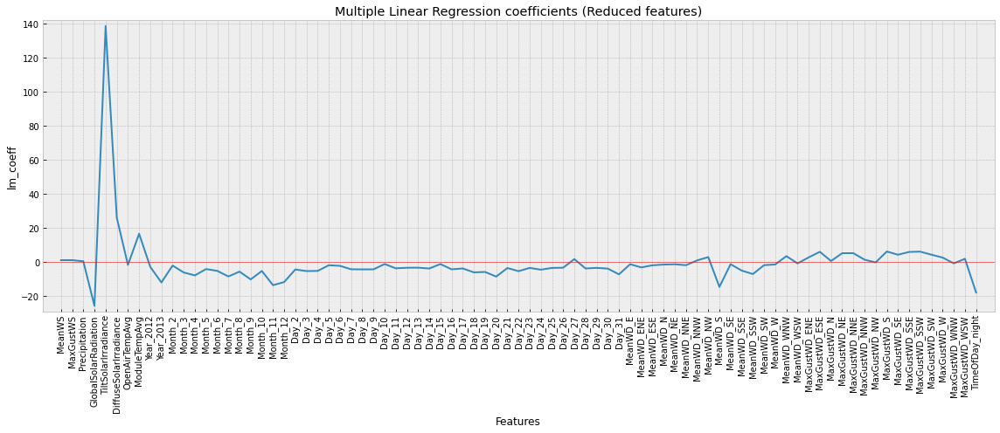

In [50]:
# Plotting the coefficients to check the importance of each coefficient 

# Plot the coefficients
_ = plt.figure(figsize = (16, 7))
_ = plt.plot(range(len(X_train.columns)), lm_red.coef_)
_ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation = 90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth = 0.5, color = 'r')
_ = plt.title('Multiple Linear Regression coefficients (Reduced features)')
_ = plt.ylabel('lm_coeff')
_ = plt.xlabel('Features')
_ = plt.tight_layout()

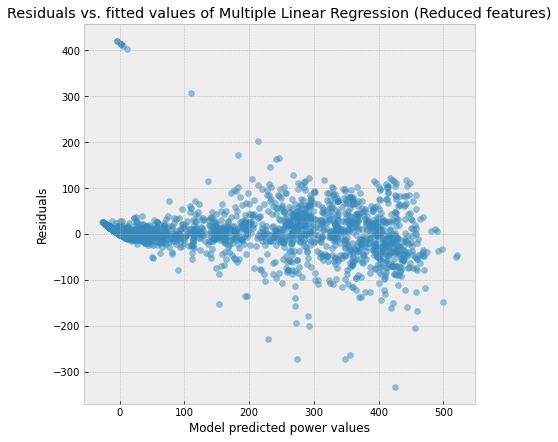

In [51]:
# PLotting the residuals
residuals = (y_test - lm_red.predict(X_test))
_ = plt.figure(figsize=(7,7))
_ = plt.scatter(lm_red.predict(X_test) , residuals, alpha = 0.5) 
_ = plt.xlabel("Model predicted power values")
_ = plt.ylabel("Residuals")
_ = plt.title("Residuals vs. fitted values of Multiple Linear Regression (Reduced features)")

In [53]:
print('Multiple Linear Regression (Reduced features) on training set')
error_metrics(lm_red.predict(X_train), y_train, model_name = 'Multiple Linear Regression (Reduced features) with scaling', test = False)

print('\nMultiple Linear Regression (Reduced features) on test set')
error_metrics(lm_red.predict(X_test), y_test, model_name = 'Multiple Linear Regression (Reduced features) with scaling', test = True)


Multiple Linear Regression (Reduced features) on training set

Error metrics for model Multiple Linear Regression (Reduced features) with scaling
RMSE or Root mean squared error: 39.30
Variance score: 0.94
Mean Absolute Error: 20.48

Multiple Linear Regression (Reduced features) on test set

Error metrics for model Multiple Linear Regression (Reduced features) with scaling
RMSE or Root mean squared error: 40.65
Variance score: 0.93
Mean Absolute Error: 22.77


In [54]:
# Plotting the predicted values with the original time series (test set)
plot_ts_pred(y_test, lm_red.predict(X_test), model_name='Multiple Linear Regression (Reduced features) with scaling', 
             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

## 4.5.3 Elastic Net Regression <a name="3.5"></a>

#### Trying Elastic net regression on the above reduced X space

In [55]:
# Trying elastic net regression

# Import necessary modules
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

def trend_model(data, cols_to_transform, l1_space, alpha_space, cols_use = 0, scale = True, test_size = 0.15, 
                include_test_scale=False):
    """
    Tuning, fitting and predicting with an Elastic net regression model.
    data: time series dataframe including X and y variables
    col_use: columns including the y variable to be used from the data
    cols_to_transform: columns to be scaled using StandardScaler if scale = True
    l1_space: potential values to try for the l1_ratio parameter of the elastic net regression
    include_test_scale: If True then the StandardScaler will be fit on the entire dataset instead of just the training set
    
    l1_ratio: The ElasticNet mixing parameter, with 0 <= l1_ratio <= 1. 
    For l1_ratio = 0 the penalty is an L2 penalty. For l1_ratio = 1 it is an L1 penalty. 
    For 0 < l1_ratio < 1, the penalty is a combination of L1 and L2.
    """
    
    # Creating the train test split
    if cols_use != 0:
        df = data[cols_use]
    else:
        df = data
    
    X_train, X_test, y_train, y_test = train_test(df, test_size = test_size, 
                                              scale = scale, cols_to_transform=cols_to_transform, 
                                              include_test_scale=include_test_scale)

    
    # Create the hyperparameter grid
    #l1_space = np.linspace(0, 1, 50)
    param_grid = {'l1_ratio': l1_space, 'alpha': alpha_space}

    # Instantiate the ElasticNet regressor: elastic_net
    elastic_net = ElasticNet()

    # for time-series cross-validation set 5 folds
    tscv = TimeSeriesSplit(n_splits=5)

    # Setup the GridSearchCV object: gm_cv ...trying 5 fold cross validation 
    gm_cv = GridSearchCV(elastic_net, param_grid, cv = tscv)

    # Fit it to the training data
    gm_cv.fit(X_train, y_train)

    # Predict on the test set and compute metrics
    y_pred = gm_cv.predict(X_test)
    r2 = gm_cv.score(X_test, y_test)
    mse = mean_squared_error(y_test, y_pred)
    print("Tuned ElasticNet l1 ratio: {}".format(gm_cv.best_params_))
    print("Tuned ElasticNet R squared: {}".format(r2))
    print("Tuned ElasticNet RMSE: {}".format(np.sqrt(mse)))
    # fitting the elastic net again using the best model from above

    elastic_net_opt = ElasticNet(l1_ratio = gm_cv.best_params_['l1_ratio']) 
    elastic_net_opt.fit(X_train, y_train)
    
    # Plot the coefficients
    _ = plt.figure(figsize = (15, 7))
    _ = plt.plot(range(len(X_train.columns)), elastic_net_opt.coef_)
    _ = plt.xticks(range(len(X_train.columns)), X_train.columns.values, rotation = 90)
    _ = plt.margins(0.02)
    _ = plt.axhline(0, linewidth = 0.5, color = 'r')
    _ = plt.title('Significane of features as per Elastic Net Regression')
    _ = plt.ylabel('Elastic net coeff')
    _ = plt.xlabel('Features')
    
    # Plotting y_true vs predicted
    _ = plt.figure(figsize = (5,5))
    _ = plot_predvstrue_reg(elastic_net_opt.predict(X_test), y_test, model_name = 'Elastic net optimal Linear Regression')
    
    # returns the train and test X and y sets and also the optimal model
    return X_train, X_test, y_train, y_test, elastic_net_opt

In [56]:
data = df1
cols_to_transform = ['MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']
l1_space = np.linspace(0, 1, 30)
alpha_space = np.logspace(-2, 0, 30)

Tuned ElasticNet l1 ratio: {'alpha': 0.727895384398315, 'l1_ratio': 1.0}
Tuned ElasticNet R squared: 0.9354381143904491
Tuned ElasticNet RMSE: 40.112490188721196


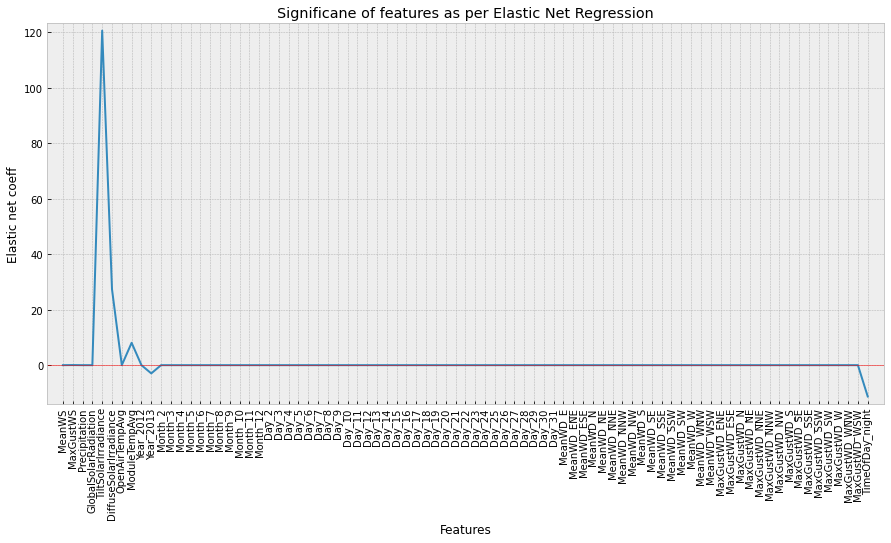

<Figure size 360x360 with 0 Axes>

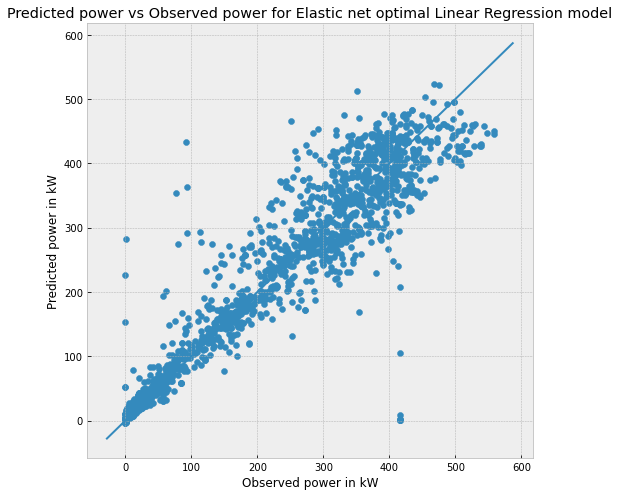

In [57]:
# Fitting, tuning and predicting using the best elastic net regression model
import warnings  
warnings.filterwarnings('ignore')
X_train, X_test, y_train, y_test, elastic_net_opt = trend_model(data=data, cols_to_transform=cols_to_transform, 
                                                                l1_space=l1_space, alpha_space=alpha_space,
                                                                scale = True, test_size = 0.15, include_test_scale=False)

In [58]:
# Plotting the observed test energy and predicted energy data on the same graph as line plots

plot_ts_pred(y_test, elastic_net_opt.predict(X_test), model_name='Optimal Elastic Net Regression', \
             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

In [59]:
# printing the error metrics
print('Elastic net regression on training set')
error_metrics(elastic_net_opt.predict(X_train), y_train, model_name = 'Tuned elastic net regression with reduced hour space', 
              test = False)

print('\nElastic net regression on test set')
error_metrics(elastic_net_opt.predict(X_test), y_test, model_name = 'Tuned elastic net regression with reduced hour space', 
              test = True)

Elastic net regression on training set

Error metrics for model Tuned elastic net regression with reduced hour space
RMSE or Root mean squared error: 39.75
Variance score: 0.94
Mean Absolute Error: 19.46

Elastic net regression on test set

Error metrics for model Tuned elastic net regression with reduced hour space
RMSE or Root mean squared error: 40.11
Variance score: 0.94
Mean Absolute Error: 17.86


* The optimized model here has a l1_ratio which is close to 1 which means it is almost like a Lasso regression model ($L1$ regularization).
* We see that the regression model's performance decreases by clubbing the hours into larger bins. In fact in terms of RMSE, it performs poorer than the baseline model on the test set.

***
# 4.6 Random Forest Regression <a name="4"></a>
***

### Trying Random Forest regression on the above reduced X space (clubbing hours into larger bins)


In [60]:
from sklearn.ensemble import RandomForestRegressor

In [61]:
# Tuning Random forest
# n_estimators = number of trees in the forest
# max_features = max number of features considered for splitting a node

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(10, 200, 10, endpoint=True)]
max_features = ['auto', 'sqrt']
max_depth = list(range(1,6))
# Create the random grid
random_grid = {'n_estimators': n_estimators, 'max_features': max_features, 'max_depth':max_depth}
print(random_grid)

{'n_estimators': [10, 31, 52, 73, 94, 115, 136, 157, 178, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [1, 2, 3, 4, 5]}


In [62]:
#import randomsearchcv
from sklearn.model_selection import RandomizedSearchCV

# First create the base model to tune
rf = RandomForestRegressor()

# Creating a time series split as discussed in the Introduction
tscv = TimeSeriesSplit(n_splits=5)

# Random search of parameters
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                               cv = tscv, verbose=2, random_state = 42, n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

rf_random.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 73, 'max_features': 'auto', 'max_depth': 5}

In [63]:
rf_random.score(X_train, y_train)

0.9485107013230997

In [64]:
rf_random.score(X_test, y_test) 

0.9433156692863495

In [65]:
# Plotting the observed test power and predicted power data on the same graph as line plots

plot_ts_pred(y_test, rf_random.predict(X_test), model_name='Tuned Random Forest with reduced hour space', \
             og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

In [66]:
# Random forest error metrics

print('Tuned Random forest errors on training set')
error_metrics(rf_random.predict(X_train), y_train, model_name = 'Tuned Random Forest with reduced hour space', test = False)
print('\nTuned Random forest errors on test set')
error_metrics(rf_random.predict(X_test), y_test, model_name = 'Tuned Random Forest with reduced hour space', test = True)

Tuned Random forest errors on training set

Error metrics for model Tuned Random Forest with reduced hour space
RMSE or Root mean squared error: 36.84
Variance score: 0.95
Mean Absolute Error: 17.01

Tuned Random forest errors on test set

Error metrics for model Tuned Random Forest with reduced hour space
RMSE or Root mean squared error: 37.59
Variance score: 0.94
Mean Absolute Error: 16.58


* Perform better than all other models

***
# 5. Adding lags as X variables (Elastic Net & RF) <a name="5"></a>
***

### Adding lags to data


In [67]:
df1_lin = df1.copy()
df1_lin.head(2)

,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg,Year_2012,Year_2013,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Day_2,Day_3,Day_4,Day_5,Day_6,Day_7,Day_8,Day_9,Day_10,Day_11,Day_12,Day_13,Day_14,Day_15,Day_16,Day_17,Day_18,Day_19,Day_20,Day_21,Day_22,Day_23,Day_24,Day_25,Day_26,Day_27,Day_28,Day_29,Day_30,Day_31,MeanWD_E,MeanWD_ENE,MeanWD_ESE,MeanWD_N,MeanWD_NE,MeanWD_NNE,MeanWD_NNW,MeanWD_NW,MeanWD_S,MeanWD_SE,MeanWD_SSE,MeanWD_SSW,MeanWD_SW,MeanWD_W,MeanWD_WNW,MeanWD_WSW,MaxGustWD_ENE,MaxGustWD_ESE,MaxGustWD_N,MaxGustWD_NE,MaxGustWD_NNE,MaxGustWD_NNW,MaxGustWD_NW,MaxGustWD_S,MaxGustWD_SE,MaxGustWD_SSE,MaxGustWD_SSW,MaxGustWD_SW,MaxGustWD_W,MaxGustWD_WNW,MaxGustWD_WSW,TimeOfDay_night
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-08-01 00:00:00,4.0,6.2,0.0,0.0,0.0,0.0,25.0,22.016667,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
2011-08-01 01:00:00,4.5,14.0,0.0,0.0,0.0,0.0,24.8,22.083333,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1


In [68]:
# Adding max 24 lags; lag1 is the value of the power generation in the previous hour, lag2 is the value of power generation..
#..2 hours before the current value and so on.

# Creating the lag variables
for i in range(24):
    df1_lin['lag'+str(i+1)] = df1_lin['PowerAvg'].shift(i+1)

In [69]:
# Since the first 24 values won't have any 24th lag, they will be NaN. So dropping the NaNs
lag_df1_lin = df1_lin.dropna()

In [70]:
lag_df1_lin.head(5)

,MeanWS,MaxGustWS,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,OpenAirTempAvg,ModuleTempAvg,PowerAvg,Year_2012,Year_2013,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,Day_2,Day_3,Day_4,Day_5,Day_6,Day_7,Day_8,Day_9,Day_10,Day_11,Day_12,Day_13,Day_14,Day_15,Day_16,Day_17,Day_18,Day_19,Day_20,Day_21,Day_22,Day_23,Day_24,Day_25,Day_26,Day_27,Day_28,Day_29,Day_30,Day_31,MeanWD_E,MeanWD_ENE,MeanWD_ESE,MeanWD_N,MeanWD_NE,MeanWD_NNE,MeanWD_NNW,MeanWD_NW,MeanWD_S,MeanWD_SE,MeanWD_SSE,MeanWD_SSW,MeanWD_SW,MeanWD_W,MeanWD_WNW,MeanWD_WSW,MaxGustWD_ENE,MaxGustWD_ESE,MaxGustWD_N,MaxGustWD_NE,MaxGustWD_NNE,MaxGustWD_NNW,MaxGustWD_NW,MaxGustWD_S,MaxGustWD_SE,MaxGustWD_SSE,MaxGustWD_SSW,MaxGustWD_SW,MaxGustWD_W,MaxGustWD_WNW,MaxGustWD_WSW,TimeOfDay_night,lag1,lag2,lag3,lag4,lag5,lag6,lag7,lag8,lag9,lag10,lag11,lag12,lag13,lag14,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-08-02 00:00:00,3.4,6.2,0.0,0.0,0.0,0.0,25.6,22.850000,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0.0,0.0,0.0,0.0,4.0,61.5,190.5,281.5,383.0,386.0,520.0,562.0,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-08-02 01:00:00,4.5,13.2,0.0,0.0,0.0,0.0,25.4,22.575000,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,0.0,4.0,61.5,190.5,281.5,383.0,386.0,520.0,562.0,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-08-02 02:00:00,3.9,6.7,0.0,0.0,0.0,0.0,25.4,22.766667,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0.0,0.0,0.0,0.0,0.0,0.0,4.0,61.5,190.5,281.5,383.0,386.0,520.0,562.0,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0,0.0
2011-08-02 03:00:00,5.0,8.8,0.0,0.0,0.0,0.0,25.5,22.983333,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,61.5,190.5,281.5,383.0,386.0,520.0,562.0,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0,0.0
2011-08-02 04:00:00,5.1,10.1,0.0,0.0,0.0,0.0,25.4,22.883333,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,61.5,190.5,281.5,383.0,386.0,520.0,562.0,328.5,386.5,280.0,139.5,43.0,0.0,0.0,0.0


### Fitting Elastic Net Regression on the Lag data

In [71]:
# Fitting Elastic Net Regression model using the lag variables as the additional inputs ...
#...(extending the reduced space model)

cols_to_transform = ['MeanWS','MaxGustWS','Precipitation','GlobalSolarRadiation','TiltSolarIrradiance',
                     'DiffuseSolarIrradiance','OpenAirTempAvg','ModuleTempAvg']
# Adding the energy consumption lags to the columns to transform 
list_lags = ['lag'+str(i+1) for i in range(24)]
cols_to_transform.extend(list_lags)

X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(lag_df1_lin, \
                                                              test_size = 0.15, scale = True, \
                                                              cols_to_transform=cols_to_transform)

In [72]:
elastic_net_lag = ElasticNet(l1_ratio = 1, alpha=0.2)
elastic_net_lag.fit(X_train_lag, y_train_lag)

ElasticNet(alpha=0.2, l1_ratio=1)

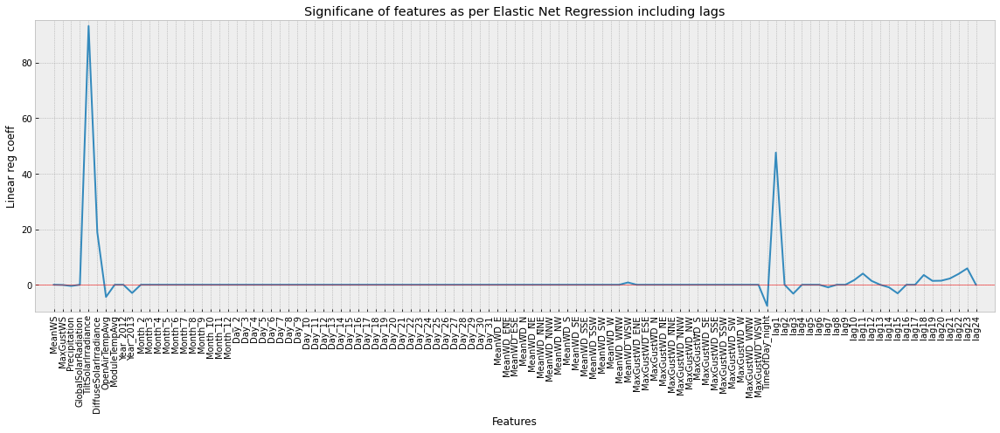

In [73]:
# Plot the coefficients for Elastic Net Regression
_ = plt.figure(figsize = (16, 7))
_ = plt.plot(range(len(X_train_lag.columns)), elastic_net_lag.coef_)
_ = plt.xticks(range(len(X_train_lag.columns)), X_train_lag.columns.values, rotation = 90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth = 0.5, color = 'r')
_ = plt.title('Significane of features as per Elastic Net Regression including lags')
_ = plt.ylabel('Linear reg coeff')
_ = plt.xlabel('Features')
_ = plt.tight_layout()

In [74]:
print('\nElastic net errors with lags on train')
error_metrics(elastic_net_lag.predict(X_train_lag), y_train_lag, model_name = 'Elastic net with all lags', test=False)
print('\nElastic net errors with lags on test')
error_metrics(elastic_net_lag.predict(X_test_lag), y_test_lag, model_name = 'Elastic net with all lags', test=True)


Elastic net errors with lags on train

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 36.21
Variance score: 0.95
Mean Absolute Error: 19.76

Elastic net errors with lags on test

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 36.68
Variance score: 0.95
Mean Absolute Error: 19.62


In [75]:
X_train_lag.columns.values

array(['MeanWS', 'MaxGustWS', 'Precipitation', 'GlobalSolarRadiation',
       'TiltSolarIrradiance', 'DiffuseSolarIrradiance', 'OpenAirTempAvg',
       'ModuleTempAvg', 'Year_2012', 'Year_2013', 'Month_2', 'Month_3',
       'Month_4', 'Month_5', 'Month_6', 'Month_7', 'Month_8', 'Month_9',
       'Month_10', 'Month_11', 'Month_12', 'Day_2', 'Day_3', 'Day_4',
       'Day_5', 'Day_6', 'Day_7', 'Day_8', 'Day_9', 'Day_10', 'Day_11',
       'Day_12', 'Day_13', 'Day_14', 'Day_15', 'Day_16', 'Day_17',
       'Day_18', 'Day_19', 'Day_20', 'Day_21', 'Day_22', 'Day_23',
       'Day_24', 'Day_25', 'Day_26', 'Day_27', 'Day_28', 'Day_29',
       'Day_30', 'Day_31', 'MeanWD_E', 'MeanWD_ENE', 'MeanWD_ESE',
       'MeanWD_N', 'MeanWD_NE', 'MeanWD_NNE', 'MeanWD_NNW', 'MeanWD_NW',
       'MeanWD_S', 'MeanWD_SE', 'MeanWD_SSE', 'MeanWD_SSW', 'MeanWD_SW',
       'MeanWD_W', 'MeanWD_WNW', 'MeanWD_WSW', 'MaxGustWD_ENE',
       'MaxGustWD_ESE', 'MaxGustWD_N', 'MaxGustWD_NE', 'MaxGustWD_NNE',
       'MaxGustWD_

In [76]:
elastic_net_lag_1 = ElasticNet(l1_ratio = 1, alpha=0.7)
elastic_net_lag_1.fit(X_train_lag, y_train_lag)

ElasticNet(alpha=0.7, l1_ratio=1)

In [77]:
print('\nElastic net errors with lags on train')
error_metrics(elastic_net_lag_1.predict(X_train_lag), y_train_lag, model_name = 'Elastic net with all lags', test=False)
print('\nElastic net errors with lags on test')
error_metrics(elastic_net_lag_1.predict(X_test_lag), y_test_lag, model_name = 'Elastic net with all lags', test=True)


Elastic net errors with lags on train

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 36.54
Variance score: 0.95
Mean Absolute Error: 19.39

Elastic net errors with lags on test

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 36.94
Variance score: 0.95
Mean Absolute Error: 19.27


### Fitting Random Forest on the lag data

In [78]:
#rflag = RandomForestRegressor()
#rflag.fit()

# First create the base model to tune
rf = RandomForestRegressor()
tscv = TimeSeriesSplit(n_splits=5)

# Random search of parameters
rflag = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                               cv = tscv, verbose=2, random_state = 42, n_jobs = -1)

# Fit the random search model
rflag.fit(X_train_lag, y_train_lag)

rflag.best_params_
#rf.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 73, 'max_features': 'auto', 'max_depth': 5}

In [79]:
RF = RandomForestRegressor(n_estimators= rflag.best_params_['n_estimators'], 
                                  max_features=rflag.best_params_['max_features'], 
                                  max_depth= rflag.best_params_['max_depth'], random_state = 42)
RF.fit(X_train_lag, y_train_lag)

RandomForestRegressor(max_depth=5, n_estimators=73, random_state=42)

In [80]:
# comparison of scores using elastic net and RF on the lag dataset

print('Random forest errors with lags on training')
error_metrics(RF.predict(X_train_lag), y_train_lag, model_name = 'Random forest with all lags', test=False)
print('\nRandom forest errors with lags on test')
error_metrics(RF.predict(X_test_lag), y_test_lag, model_name = 'Random forest with all lags', test=True)

Random forest errors with lags on training

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 33.78
Variance score: 0.96
Mean Absolute Error: 16.29

Random forest errors with lags on test

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 32.27
Variance score: 0.96
Mean Absolute Error: 15.08


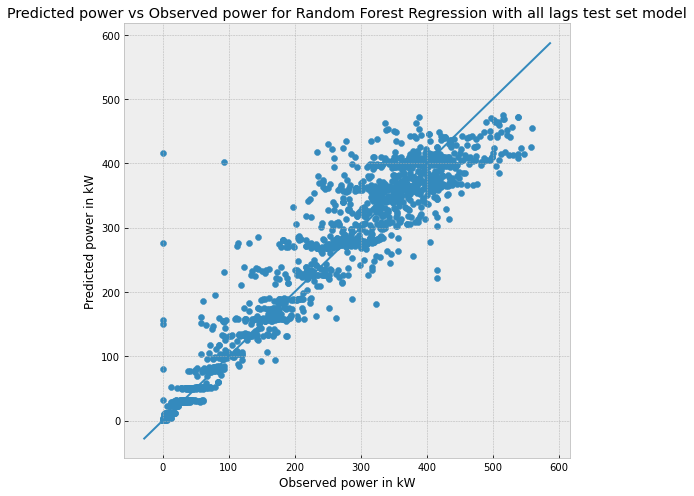

In [81]:
plot_predvstrue_reg(RF.predict(X_test_lag), y_test_lag, 
                    model_name = 'Random Forest Regression with all lags test set')

In [82]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = X_test_lag.index, y = np.array(y_test_lag), name = "Observed",
                         line_color = 'deepskyblue', opacity = 0.5))

fig.add_trace(go.Scatter(x = X_test_lag.index, y = RF.predict(X_test_lag), name = "Prediction: Random Forest Regression with lag Data",
                         line_color = 'lightslategrey', opacity = 0.5))

fig.update_layout(title_text = 'Observed Vs Predicted Power using Random Forest Regression \
using lags upto 24h on test set',
                  xaxis_rangeslider_visible = True)
fig.show()

In [83]:
# Feature importance
feature_imp = pd.Series(RF.feature_importances_, index=X_train_lag.columns).sort_values(ascending=False)
feature_imp

GlobalSolarRadiation      9.246791e-01
TiltSolarIrradiance       5.752318e-02
lag1                      1.205439e-02
DiffuseSolarIrradiance    2.868636e-03
lag24                     1.055835e-03
ModuleTempAvg             6.419684e-04
lag21                     1.729327e-04
lag7                      1.219328e-04
lag22                     8.531383e-05
lag8                      7.503761e-05
lag23                     6.895417e-05
MeanWS                    6.861873e-05
lag2                      6.820276e-05
MaxGustWS                 6.726595e-05
lag20                     5.377637e-05
Precipitation             4.839283e-05
lag5                      4.566778e-05
lag9                      4.204258e-05
lag3                      4.117702e-05
OpenAirTempAvg            3.112856e-05
lag10                     2.038134e-05
lag6                      1.941778e-05
Year_2013                 1.884618e-05
lag12                     1.584736e-05
lag19                     1.583733e-05
lag4                     

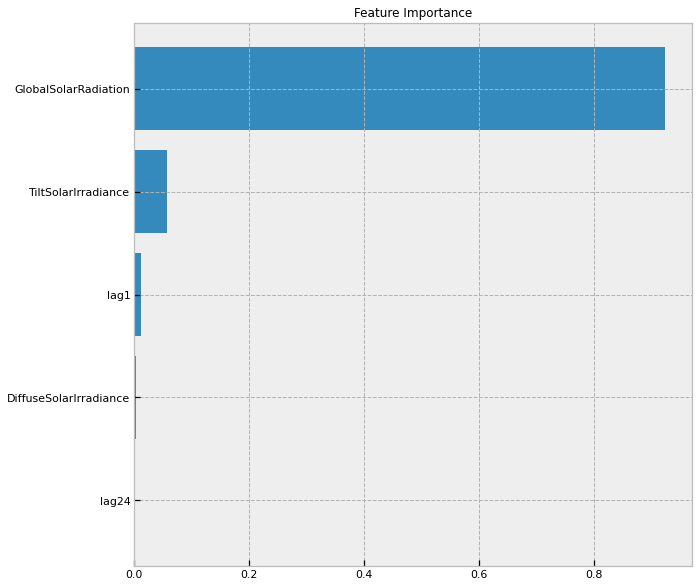

In [84]:
# Sorting in descending order and rearranging feature names to match sorted feature importance
features = X_train_lag.columns
importance = RF.feature_importances_
indices = np.argsort(importance)

num_features = 5
# Bar chart creation
sns.set_context("notebook")
plt.figure(figsize=(10, 10))
plt.title("Feature Importance")
plt.barh(range(num_features), importance[indices[-num_features:]])
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])

plt.show()

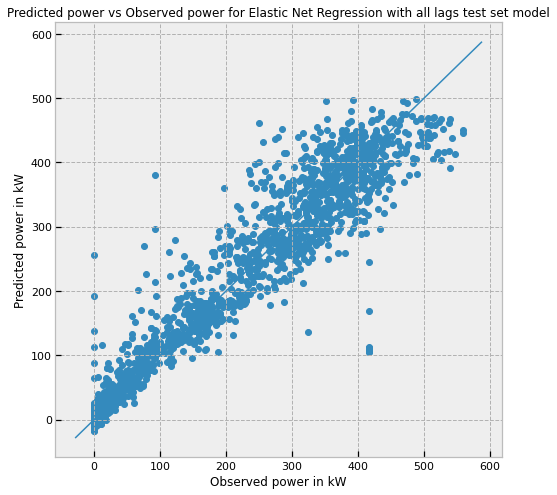

In [85]:
plot_predvstrue_reg(elastic_net_lag.predict(X_test_lag), y_test_lag, 
                    model_name = 'Elastic Net Regression with all lags test set')

In [86]:
# Plotting the observed test values, and predicted test values using the above Elastic net and Random forest models using lags
#..up to last 24 hour values

fig = go.Figure()

fig.add_trace(go.Scatter(x = X_test_lag.index, y = np.array(y_test_lag), name = "observed",
                         line_color = 'deepskyblue', opacity = 0.5))

fig.add_trace(go.Scatter(x = X_test_lag.index, y = rflag.predict(X_test_lag), name = "Random forest predictions",
                         line_color = 'lightslategrey', opacity = 0.5))

fig.add_trace(go.Scatter(x = X_test_lag.index, y = elastic_net_lag.predict(X_test_lag), name = "Elastic net predictions",
                         line_color = 'lightcoral', opacity = 0.5))

fig.update_layout(title_text = 'Observed test set vs Predicted energy using Random forest & elastic net \
reg using lags upto 24h on test set',
                  xaxis_rangeslider_visible = True)
fig.show()

In [87]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = X_test_lag.index, y = np.array(y_test_lag), name = "Observed",
                         line_color = 'deepskyblue', opacity = 0.5))

fig.add_trace(go.Scatter(x = X_test_lag.index, y = elastic_net_lag.predict(X_test_lag), name = "Prediction: Elastic Net Regression with lag Data",
                         line_color = 'lightslategrey', opacity = 0.5))

fig.update_layout(title_text = 'Observed Vs Predicted Power using Elastic Net Regression \
using lags upto 24h on test set',
                  xaxis_rangeslider_visible = True)
fig.show()

* Both Elastic net and Random Forest models give excellent performance by using all lags up to past 24 hours. 
* Random Forest seems to perform better than Elastic net here.
* From the coefficient plot it can be seen how the Tilt solar irradiance, diffuce solar irradiance and lag 1 are the most important predictors. 
* This model performs very well but it comes with a limitation- we can use it to predict only the next hour value. That is, the maximum time window it can predict accurately is 1 hour. So, if that is the application case then the elastic net model with previous lag values should be used.
***